## **Análisis Exploratorio de Datos INMET (EDA-INMET)**

Se realiza un análisis exploratorio de la radiación para comprender la estructura, calidad y comportamiento de los datos antes de aplicar modelos o realizar inferencias.

### **Proceso de Extraer, Transformar y Cargar (ETL)**

#### **Importan librerías**

In [ ]:
import os
from pandas.plotting import autocorrelation_plot
import warnings
import pandas as pd
import seaborn as sns
import requests
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import plotly.graph_objects as go
from IPython.display import display
from scipy.stats import ks_2samp
# from TSPackages import *
from scipy.stats import jarque_bera
from scipy.stats import ks_2samp
from scipy.stats import kurtosis, skew
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
warnings.filterwarnings('ignore')
from pandas.plotting import autocorrelation_plot
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import os

#### **Importan los datos**

In [ ]:
file_path = [
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2019_A_31-12-2019.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2020_A_31-12-2020.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2021_A_31-12-2021.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2022_A_31-12-2022.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2023_A_31-12-2023.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2024_A_31-12-2024.CSV",
    r"C:\Users\Keyla Alba\OneDrive - Universidad del Norte\Doctorado (Ciencias)\Move La America\EDA\Datos\INMET_CO_MS_A710_PARANAIBA_01-01-2025_A_28-02-2025.CSV"
]

def load_and_clean(file_path):
    df = pd.read_csv(file_path, sep=';', encoding='latin1', skiprows=8)
    df.columns = [col.strip().upper() for col in df.columns]
    for col in df.columns:
        if "RADIACAO" in col and "KJ" in col:
            df.rename(columns={col: "RADIACAO_GLOBAL"}, inplace=True)
            break
    df['HORA UTC'] = df['HORA UTC'].astype(str).str.replace(' UTC', '', regex=False)
    df['HORA UTC'] = df['HORA UTC'].str.zfill(4)
    df['HORA UTC'] = df['HORA UTC'].str[:2] + ':' + df['HORA UTC'].str[2:4]
    df['datetime'] = pd.to_datetime(df['DATA'] + ' ' + df['HORA UTC'], format='%Y/%m/%d %H:%M', errors='coerce')
    df['RADIACAO_GLOBAL'] = pd.to_numeric(df['RADIACAO_GLOBAL'], errors='coerce').fillna(0)
    return df[['datetime', 'RADIACAO_GLOBAL']]
df_INMET = pd.concat([load_and_clean(fp) for fp in file_path], ignore_index=True)
print(df_INMET.shape)
df_INMET.head(n=14)

(54024, 2)


,datetime,RADIACAO_GLOBAL
0,2019-01-01 00:00:00,0.0
1,2019-01-01 01:00:00,0.0
2,2019-01-01 02:00:00,0.0
3,2019-01-01 03:00:00,0.0
4,2019-01-01 04:00:00,0.0
5,2019-01-01 05:00:00,0.0
6,2019-01-01 06:00:00,0.0
7,2019-01-01 07:00:00,0.0
8,2019-01-01 08:00:00,0.0
9,2019-01-01 09:00:00,0.0


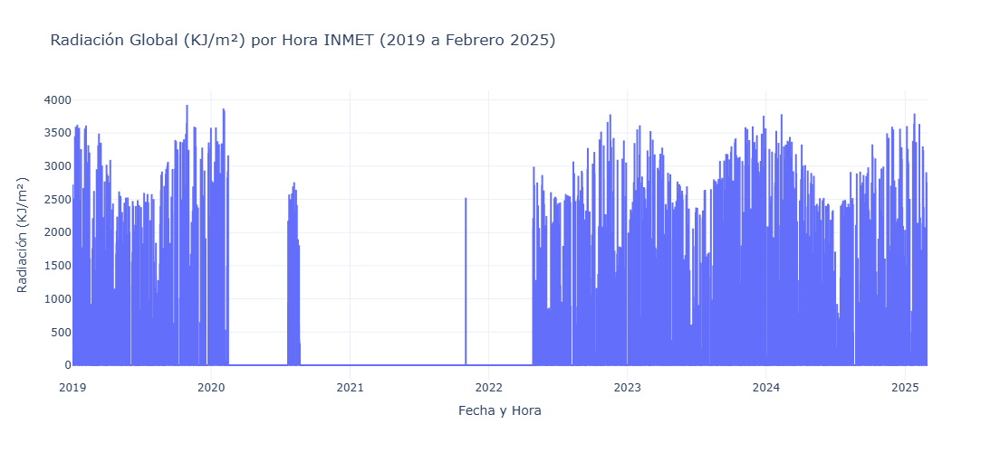

In [ ]:
fig_INMET = px.line(
    df_INMET,
    x='datetime',
    y='RADIACAO_GLOBAL',
    title='Radiación Global (KJ/m²) por Hora INMET (2019 a Febrero 2025)',
    labels={
        'datetime': 'Fecha y Hora',
        'RADIACAO_GLOBAL': 'Radiación (KJ/m²)'
    }
)
fig_INMET.update_layout(template='plotly_white', width=1100, height=500)
fig_INMET.show()

#### **Imputación usando promedio estacional**

Uno de los retos fundamentales en el análisis de series temporales de radiación solar es la presencia de valores faltantes, especialmente en estaciones meteorológicas con limitaciones técnicas o períodos de inestabilidad climática. Una alternativa eficaz para abordar este problema es la Regla de Imputación Estacional, la cual consiste en reemplazar los datos perdidos utilizando el promedio de los valores registrados en la misma hora y día de otros años o meses, respetando así la estacionalidad y patrones cíclicos propios de la variable. Esta técnica resulta particularmente adecuada para variables como la radiación solar, que presenta una fuerte dependencia temporal y comportamiento periódico. En este contexto, \cite{mohamad2022case} analizaron el rendimiento de métodos univariantes de imputación bajo diferentes condiciones climáticas, concluyendo que las estrategias basadas en estacionalidad ofrecen ventajas significativas en climas tropicales. De manera complementaria, \cite{hissou2023novel} enfatizan que una adecuada imputación mejora sustancialmente la precisión de modelos de predicción basados en aprendizaje automático, al reducir la incertidumbre asociada al preprocesamiento de datos meteorológicos.

**Regla de Imputación Estacional**

Supongamos que tienes una serie de datos:

- $R_i$: valor de radiación en la observación $i$
- $d_i$: día del año de la observación $i$ (de 1 a 366)
- $h_i$: hora del día de la observación $i$ (de 0 a 23)

Para cada observación con valor faltante $R_i = 0$, la imputación es:

$$
\hat{R}_i = \frac{1}{n_{d_i,h_i}} \sum_{j \in G(d_i,h_i)} R_j
$$

  Donde:

- $\hat{R}_i$ es el valor imputado para la observación $i$
- $G(d_i, h_i)$ es el conjunto de observaciones $j$ donde $R_j > 0$, y el día y la hora coinciden con $d_i, h_i$
- $n_{d_i,h_i}$ es el número de valores disponibles en ese grupo

> Si no existen datos en ese grupo:

$$
\hat{R}_i = 0
$$


In [ ]:
df_INMET['RADIACAO_GLOBAL_IMPUTADA'] = df_INMET['RADIACAO_GLOBAL'].replace(0, pd.NA)
df_INMET['datetime'] = pd.to_datetime(df_INMET['datetime'])
df_INMET['dayofyear'] = df_INMET['datetime'].dt.dayofyear
df_INMET['hour'] = df_INMET['datetime'].dt.hour

tabla_promedios = df_INMET.groupby(['dayofyear', 'hour'])['RADIACAO_GLOBAL_IMPUTADA'].mean()
def imputar_estacional(row):
    if pd.isna(row['RADIACAO_GLOBAL_IMPUTADA']):
        return tabla_promedios.get((int(row['dayofyear']), int(row['hour'])), 0)
    else:
        return row['RADIACAO_GLOBAL_IMPUTADA']
df_INMET['RADIACAO_GLOBAL_IMPUTADA'] = df_INMET.apply(imputar_estacional, axis=1)
df_INMET['RADIACAO_GLOBAL_IMPUTADA'] = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].fillna(0)
print(df_INMET.shape)
df_INMET.tail(20)

(54024, 5)


,datetime,RADIACAO_GLOBAL,RADIACAO_GLOBAL_IMPUTADA,dayofyear,hour
54004,2025-02-28 04:00:00,0.0,0.0,59,4
54005,2025-02-28 05:00:00,0.0,0.0,59,5
54006,2025-02-28 06:00:00,0.0,0.0,59,6
54007,2025-02-28 07:00:00,0.0,0.0,59,7
54008,2025-02-28 08:00:00,0.0,0.0,59,8
54009,2025-02-28 09:00:00,0.0,0.0,59,9
54010,2025-02-28 10:00:00,0.0,0.0,59,10
54011,2025-02-28 11:00:00,0.0,0.0,59,11
54012,2025-02-28 12:00:00,0.0,1749.0,59,12
54013,2025-02-28 13:00:00,0.0,0.0,59,13


In [ ]:
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=df_INMET['datetime'],
    y=df_INMET['RADIACAO_GLOBAL_IMPUTADA'],
    mode='lines',
    name='INMET-IMPUTADA',
    line=dict(color='orange'),
    opacity=0.7
))
fig.add_trace(go.Scatter(
    x=df_INMET['datetime'],
    y=df_INMET['RADIACAO_GLOBAL'],
    mode='lines',
    name='INMET-SIN IMPUTAR',
    line=dict(color='blue'),
    opacity=0.7
))
fig.update_layout(
    title='Evolución de Radiación INMET - Imputación Promedio Estacional (2019-2025)',
    xaxis_title='Fecha y Hora',
    yaxis_title='Radiación (KJ/m²)',
    legend_title='Fuente',
    template='plotly_white',
    height=500,
    width=1100
)
fig.show()

df_INMET.to_csv("df_INMET_exportado.csv", index=False, encoding='utf-8')

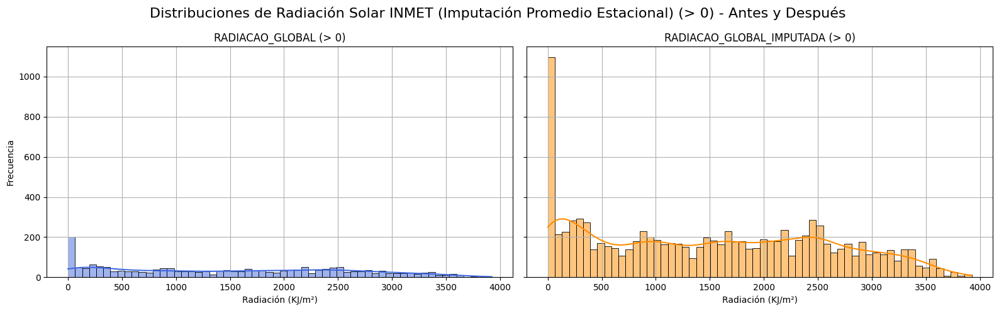

Kolmogorov-Smirnov Test (Distribución Original vs Imputada):
Estadístico KS: 0.0153
p-valor: 8.3915e-01
No se rechaza H0 → Las distribuciones son estadísticamente similares.


In [ ]:
rad_orig = df_INMET['RADIACAO_GLOBAL'][df_INMET['RADIACAO_GLOBAL'] > 0]
rad_imp = df_INMET['RADIACAO_GLOBAL_IMPUTADA'][df_INMET['RADIACAO_GLOBAL_IMPUTADA'] > 0]

fig, axes = plt.subplots(1, 2, figsize=(16, 5), sharey=True)

sns.histplot(rad_orig, bins=60, kde=True, color='royalblue', ax=axes[0])
axes[0].set_title('RADIACAO_GLOBAL (> 0)')
axes[0].set_xlabel('Radiación (KJ/m²)')
axes[0].set_ylabel('Frecuencia')
axes[0].grid(True)

sns.histplot(rad_imp, bins=60, kde=True, color='darkorange', ax=axes[1])
axes[1].set_title('RADIACAO_GLOBAL_IMPUTADA (> 0)')
axes[1].set_xlabel('Radiación (KJ/m²)')
axes[1].set_ylabel('')
axes[1].grid(True)

fig.suptitle('Distribuciones de Radiación Solar INMET (Imputación Promedio Estacional) (> 0) - Antes y Después ', fontsize=16)
plt.tight_layout()
plt.show()

rad_orig = df_INMET['RADIACAO_GLOBAL'][df_INMET['RADIACAO_GLOBAL'] > 0]
rad_imp = df_INMET['RADIACAO_GLOBAL_IMPUTADA'][df_INMET['RADIACAO_GLOBAL_IMPUTADA'] > 0]
stat_ks, p_ks = ks_2samp(rad_orig, rad_imp)
print("Kolmogorov-Smirnov Test (Distribución Original vs Imputada):")
print(f"Estadístico KS: {stat_ks:.4f}")
print(f"p-valor: {p_ks:.4e}")
if p_ks > 0.05:
    print("No se rechaza H0 → Las distribuciones son estadísticamente similares.")
else:
    print("Se rechaza H0 → Las distribuciones son diferentes.")

#### **EDA**

En el contexto de la predicción de radiación solar mediante modelos de series de tiempo, es fundamental conservar la estructura completa de la serie, incluyendo los valores de radiación nocturna igual a cero. El mantenimiento de esta continuidad temporal asegura que los algoritmos puedan captar correctamente la dinámica estacional y los ciclos diarios, evitando la introducción de sesgos por omisión de periodos sin registros. Este enfoque es especialmente relevante al trabajar con modelos como redes neuronales recurrentes, regresión de soporte vectorial o procesos gaussianos, los cuales requieren secuencias homogéneas y completas para una convergencia adecuada y generalización efectiva \cite{sharifzadeh2019machine}. 

Adicionalmente, investigaciones que comparan arquitecturas híbridas de redes neuronales han resaltado que la inclusión de todos los datos horarios incluyendo los correspondientes a la noche contribuye a un entrenamiento más robusto y coherente, permitiendo una mejor adaptación a diferentes contextos geográficos y meteorológicos \cite{mukhtar2022development}.

##### **Horas**

In [ ]:
df_INMET.to_csv('df_INMET.csv', index=False)

In [ ]:
df_INMET['datetime'] = pd.to_datetime(df_INMET['datetime'])
fig = px.line(df_INMET, 
              x='datetime', 
              y='RADIACAO_GLOBAL_IMPUTADA',
              title='Time Series - Global Radiation',
              labels={'datetime': 'Date', 'RADIACAO_GLOBAL_IMPUTADA': 'Radiation'})

fig.update_layout(
    xaxis_title='Fecha',
    yaxis_title='Radiación',
    template='plotly_white',
    width=1000,
    height=500
)
fig.show()

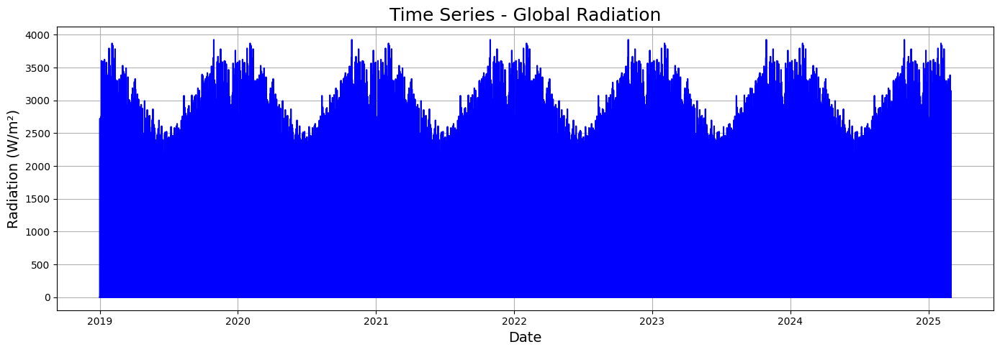

In [ ]:
df_INMET['datetime'] = pd.to_datetime(df_INMET['datetime'])
df_INMET = df_INMET.set_index('datetime')
os.makedirs("figures", exist_ok=True)
plt.figure(figsize=(14, 5))
plt.plot(df_INMET['RADIACAO_GLOBAL_IMPUTADA'], color='blue')
plt.title('Time Series - Global Radiation', fontsize=18)
plt.xlabel('Date', fontsize=14)
plt.ylabel('Radiation (W/m²)', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/Global_Radiation_TimeSeries.png", dpi=300)
plt.show()


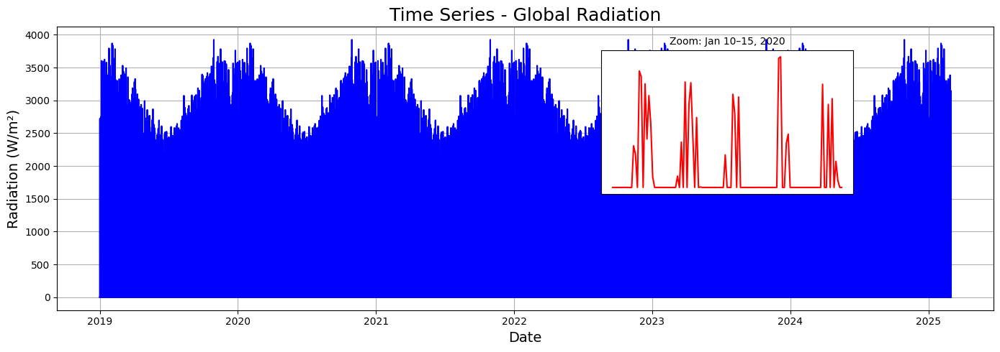

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import os

año_inicio = 2019
fechas_completas = pd.date_range(start=f"{año_inicio}-01-01 00:00:00", periods=len(df_INMET), freq='H')
df_INMET['datetime'] = fechas_completas
df_INMET = df_INMET.set_index('datetime')
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(df_INMET.index, df_INMET['RADIACAO_GLOBAL_IMPUTADA'], color='blue')
ax.set_title('Time Series - Global Radiation', fontsize=18)
ax.set_xlabel('Date', fontsize=14)
ax.set_ylabel('Radiation (W/m²)', fontsize=14)
ax.grid(True)
interval_start = pd.Timestamp("2020-01-10 00:00:00")
interval_end = pd.Timestamp("2020-01-15 00:00:00")
zoom_data = df_INMET.loc[interval_start:interval_end]
ax_inset = fig.add_axes([0.6, 0.45, 0.25, 0.4])  # [left, bottom, width, height]
ax_inset.plot(zoom_data.index, zoom_data['RADIACAO_GLOBAL_IMPUTADA'], color='red')
ax_inset.set_title('Zoom: Jan 10–15, 2020', fontsize=10)
ax_inset.grid(True)
ax_inset.set_xticks([])
ax_inset.set_yticks([])
ax_inset.set_xlabel('')
ax_inset.set_ylabel('')
os.makedirs("figures", exist_ok=True)
plt.tight_layout()
plt.savefig("figures/Global_Radiation_TimeSeries_Zoom.png", dpi=300)
plt.show()


In [ ]:
variables = ['RADIACAO_GLOBAL_IMPUTADA']
resumen = {}
for var in variables:
    data = df_INMET[var]  
    resumen[var] = {
        'N_records': len(data),
        'μ': data.mean(),
        'σ': data.std(),
        'y_min': data.min(),
        'Q1': data.quantile(0.25),
        'x̄': data.median(),
        'Q3': data.quantile(0.75),
        'y_max': data.max(),
        'Kurtosis': data.kurtosis(),
        'Skewness': data.skew()
    }
df_resumen = pd.DataFrame(resumen)
df_resumen

,RADIACAO_GLOBAL_IMPUTADA
N_records,54024.000000
μ,284.327790
σ,752.818778
y_min,0.000000
Q1,0.000000
x̄,0.000000
Q3,0.000000
y_max,3924.000000
Kurtosis,6.500850
Skewness,2.742065


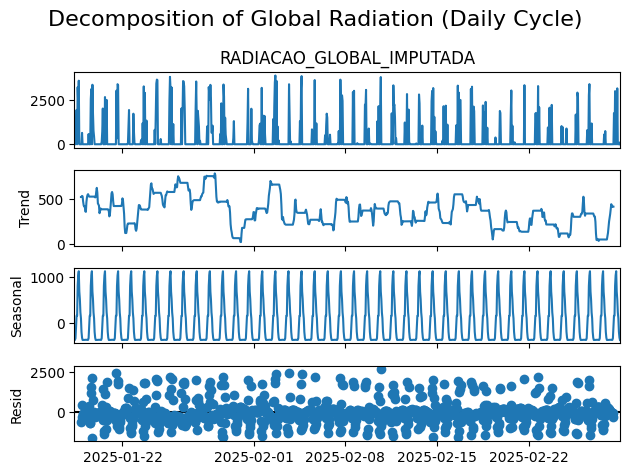

In [ ]:
from statsmodels.tsa.seasonal import seasonal_decompose
descomposicion = seasonal_decompose(df_INMET['RADIACAO_GLOBAL_IMPUTADA'].tail(1000), model='additive', period=24)
descomposicion.plot()
plt.suptitle("Decomposition of Global Radiation (Daily Cycle)", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
desc_por_hora = df_INMET.groupby('hour')['RADIACAO_GLOBAL_IMPUTADA'].describe()
desc_por_hora

,count,mean,std,min,25%,50%,75%,max
hour,,,,,,,,
0,2251.0,0.021324,0.291339,0.0,0.0,0.0,0.0,4.0
1,2251.0,0.024434,0.287252,0.0,0.0,0.0,0.0,5.0
2,2251.0,0.009329,0.167072,0.0,0.0,0.0,0.0,3.0
3,2251.0,0.032430,0.292600,0.0,0.0,0.0,0.0,4.0
4,2251.0,0.015549,0.184338,0.0,0.0,0.0,0.0,3.0
5,2251.0,0.011550,0.132832,0.0,0.0,0.0,0.0,2.0
6,2251.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0
7,2251.0,0.005775,0.075792,0.0,0.0,0.0,0.0,1.0
8,2251.0,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0


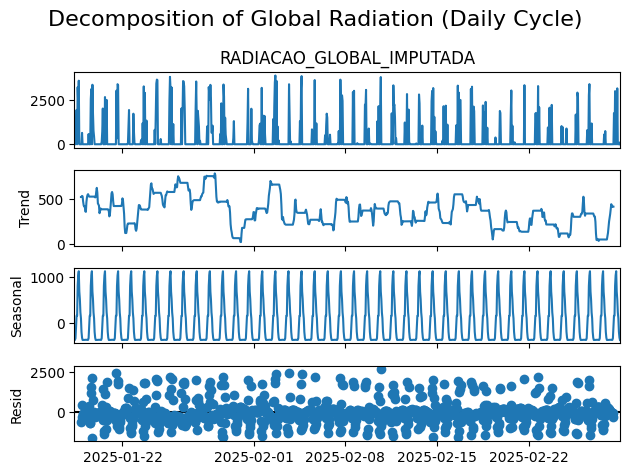

In [ ]:
descomposicion = seasonal_decompose(df_INMET['RADIACAO_GLOBAL_IMPUTADA'].tail(1000), model='additive', period=24)
fig = descomposicion.plot()
fig.suptitle("Decomposition of Global Radiation (Daily Cycle)", fontsize=16)
plt.tight_layout()
fig.savefig('figures/decomposition_global_radiation.png')
plt.show()


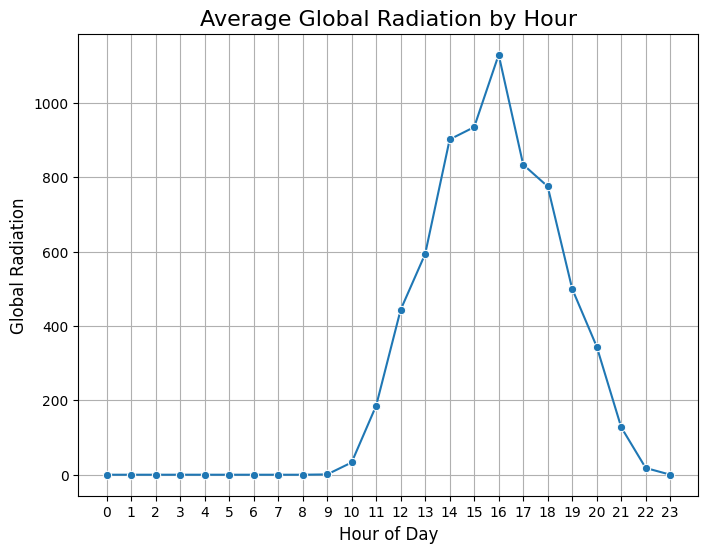

In [ ]:
os.makedirs('figures', exist_ok=True)
media_por_hora = df_INMET.groupby('hour')['RADIACAO_GLOBAL_IMPUTADA'].mean().reset_index()
plt.figure(figsize=(8, 6))
sns.lineplot(data=media_por_hora, x='hour', y='RADIACAO_GLOBAL_IMPUTADA', marker='o')
plt.title('Average Global Radiation by Hour', fontsize=16)
plt.xlabel('Hour of Day', fontsize=12)
plt.ylabel('Global Radiation', fontsize=12)
plt.xticks(range(0, 24))
plt.grid(True)
plt.savefig('figures/avg_radiation_by_hour.png')
plt.show()

In [ ]:
os.makedirs('figures', exist_ok=True)

if 'hour' not in df_INMET.columns:
    df_INMET['hour'] = df_INMET.index.hour
fig = px.box(
    df_INMET,
    x='hour',
    y='RADIACAO_GLOBAL_IMPUTADA',
    labels={
        'hour': 'Hour of Day',
        'RADIACAO_GLOBAL_IMPUTADA': 'Global Radiation'
    },
    title='Distribution of Global Radiation by Hour of the Day'
)

fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14
)
fig.write_html("figures/boxplot_radiation_by_hour_plotly.html")
fig.show()


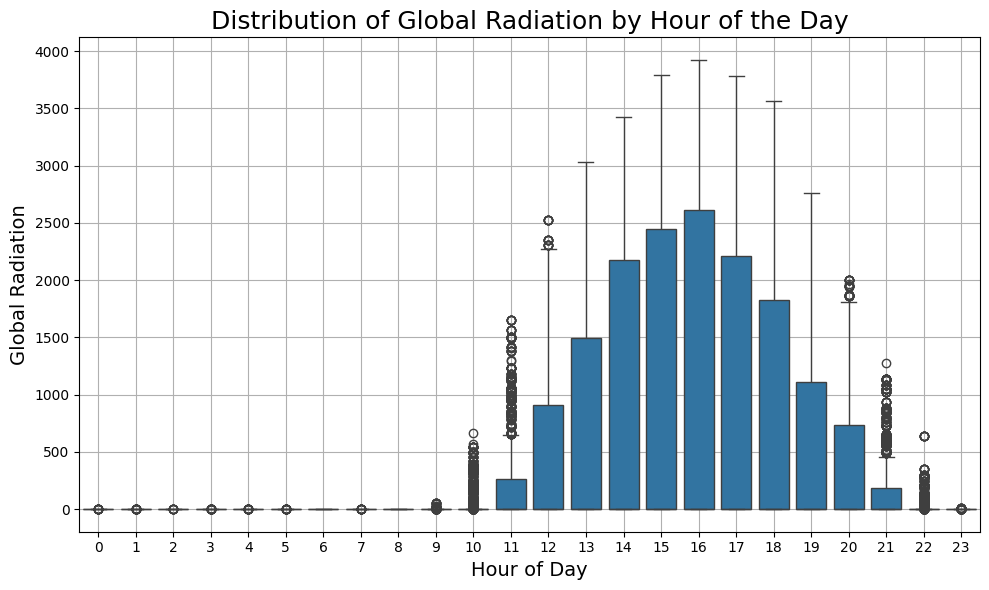

In [ ]:
os.makedirs('figures', exist_ok=True)
if 'hour' not in df_INMET.columns:
    df_INMET['hour'] = df_INMET.index.hour
plt.figure(figsize=(10, 6))
sns.boxplot(data=df_INMET, x='hour', y='RADIACAO_GLOBAL_IMPUTADA')
plt.title('Distribution of Global Radiation by Hour of the Day', fontsize=18)
plt.xlabel('Hour of Day', fontsize=14)
plt.ylabel('Global Radiation', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig('figures/boxplot_radiation_by_hour.png', dpi=300)
plt.show()


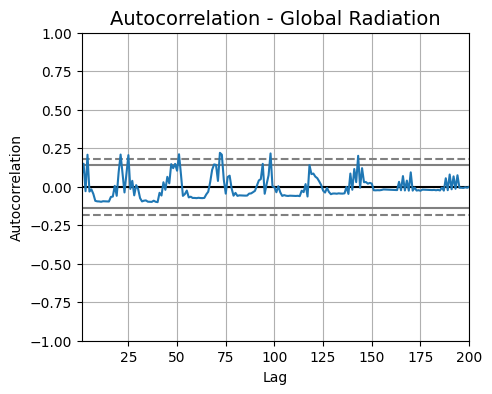

In [ ]:
os.makedirs('figures', exist_ok=True)
plt.figure(figsize=(5, 4))
autocorrelation_plot(df_INMET['RADIACAO_GLOBAL_IMPUTADA'].tail(200))
plt.title("Autocorrelation - Global Radiation", fontsize=14)
plt.grid(True)
plt.savefig("figures/autocorrelation_global_radiation.png")
plt.show()

<Figure size 500x400 with 0 Axes>

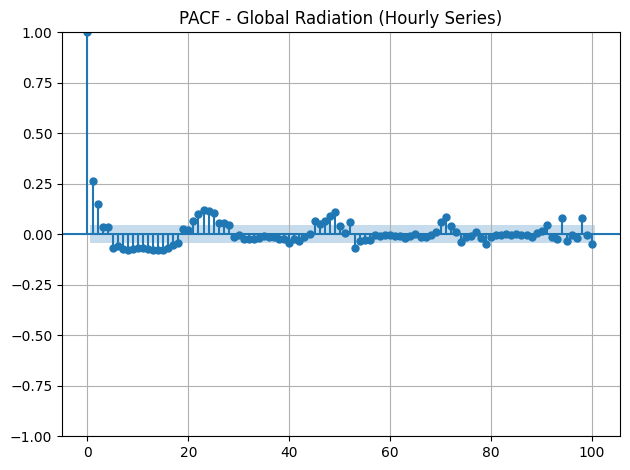

In [ ]:
from statsmodels.graphics.tsaplots import plot_pacf

os.makedirs("figures", exist_ok=True)
plt.figure(figsize=(5, 4))
plot_pacf(df_INMET['RADIACAO_GLOBAL_IMPUTADA'].tail(2000), lags=100, method='ywm')
plt.title("PACF - Global Radiation (Hourly Series)", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/pacf_hourly_compact.png")
plt.show()

####  **EDA DIARIA**

In [ ]:
df_diario = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('D').mean()
variables = ['RADIACAO_GLOBAL_IMPUTADA']
resumen = {}

for var in variables:
    data = df_diario  
    resumen[var] = {
        'N_records': len(data),
        'μ': data.mean(),
        'σ': data.std(),
        'y_min': data.min(),
        'Q1': data.quantile(0.25),
        'x̄': data.median(),
        'Q3': data.quantile(0.75),
        'y_max': data.max(),
        'Kurtosis': data.kurtosis(),
        'Skewness': data.skew()
    }
df_resumen = pd.DataFrame(resumen)
df_resumen

,RADIACAO_GLOBAL_IMPUTADA
N_records,2251.000000
μ,284.327790
σ,142.219504
y_min,0.000000
Q1,187.916667
x̄,263.104167
Q3,369.541667
y_max,799.916667
Kurtosis,0.287621
Skewness,0.546791


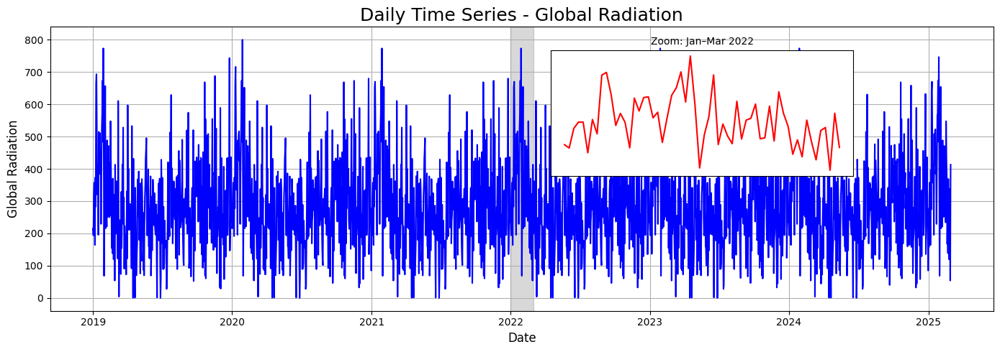

In [ ]:
os.makedirs("figures", exist_ok=True)
interval_start = "2022-01-01"
interval_end = "2022-03-01"
fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(df_diario, color='blue')
ax.set_title('Daily Time Series - Global Radiation', fontsize=18)
ax.set_xlabel('Date', fontsize=12)
ax.set_ylabel('Global Radiation', fontsize=12)
ax.grid(True)
ax.axvspan(pd.to_datetime(interval_start), pd.to_datetime(interval_end),
           color='gray', alpha=0.3, label='Zoom region')
ax_inset = fig.add_axes([0.55, 0.50, 0.3, 0.35])  # [x, y, width, height]
zoom_data = df_diario.loc[interval_start:interval_end]
ax_inset.plot(zoom_data, color='red')
ax_inset.set_title('Zoom: Jan–Mar 2022', fontsize=10)
ax_inset.set_xticks([])
ax_inset.set_yticks([])
plt.tight_layout()
plt.savefig("figures/daily_series_with_zoom_highlighted.png")
plt.show()

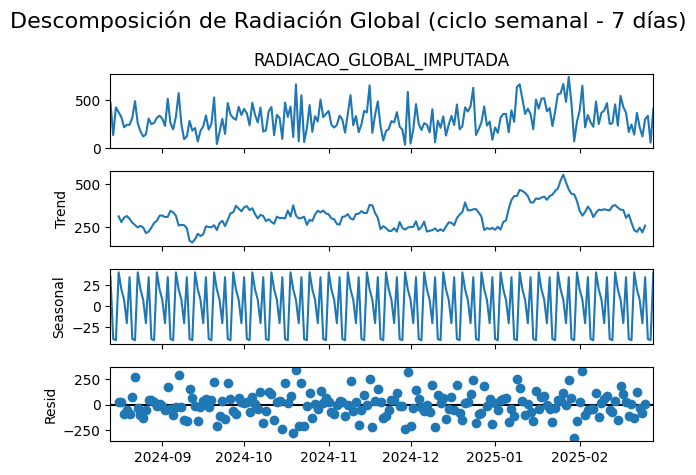

In [ ]:
descomposicion = seasonal_decompose(df_diario.tail(200), model='additive', period=7)
descomposicion.plot()
plt.suptitle('Descomposición de Radiación Global (ciclo semanal - 7 días)', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
df_INMET['day_of_week'] = df_INMET.index.day_name()
desc_por_dia = df_INMET.groupby('day_of_week')['RADIACAO_GLOBAL_IMPUTADA'].describe()
orden_dias = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
desc_por_dia = desc_por_dia.loc[orden_dias]
desc_por_dia
desc_por_dia = df_INMET.groupby('day_of_week')['RADIACAO_GLOBAL_IMPUTADA'].describe()
orden_dias = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
desc_por_dia = desc_por_dia.loc[orden_dias]
desc_por_dia

,count,mean,std,min,25%,50%,75%,max
day_of_week,,,,,,,,
Monday,7704.0,276.915390,740.072654,0.0,0.0,0.0,0.0,3924.0
Tuesday,7728.0,288.041990,760.135891,0.0,0.0,0.0,0.0,3924.0
Wednesday,7728.0,281.359645,747.620231,0.0,0.0,0.0,0.0,3924.0
Thursday,7728.0,284.264644,751.770750,0.0,0.0,0.0,0.0,3869.0
Friday,7728.0,285.984170,756.346878,0.0,0.0,0.0,0.0,3924.0
Saturday,7704.0,285.550299,753.603337,0.0,0.0,0.0,0.0,3924.0
Sunday,7704.0,288.171102,760.189282,0.0,0.0,0.0,0.0,3924.0


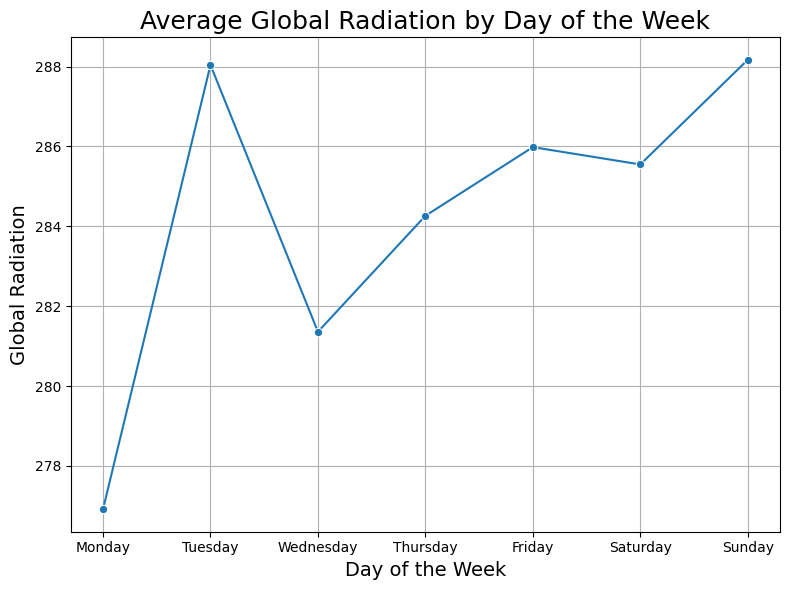

In [ ]:
os.makedirs("figures", exist_ok=True)
average_by_day = df_INMET.groupby(df_INMET.index.day_name())['RADIACAO_GLOBAL_IMPUTADA'].mean().reindex(
    ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
).reset_index()
average_by_day.columns = ['Day', 'Average Radiation']
plt.figure(figsize=(8, 6))
sns.lineplot(data=average_by_day, x='Day', y='Average Radiation', marker='o')
plt.title('Average Global Radiation by Day of the Week', fontsize=18)
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Global Radiation', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/Average_Radiation_by_Day.png", dpi=300)
plt.show()

In [ ]:
os.makedirs("figures", exist_ok=True)

daily_series = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('D').mean().dropna()
df_daily = daily_series.to_frame(name='RADIACAO_GLOBAL_IMPUTADA')
df_daily['Day'] = df_daily.index.day_name()
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
fig = px.box(
    df_daily,
    x='Day',
    y='RADIACAO_GLOBAL_IMPUTADA',
    category_orders={'Day': days_order},
    labels={
        'Day': 'Day of the Week',
        'RADIACAO_GLOBAL_IMPUTADA': 'Global Radiation (Imputed)'
    },
    title='Distribution of Imputed Global Radiation by Day of the Week'
)

fig.update_layout(
    title_font_size=18,
    xaxis_title_font_size=14,
    yaxis_title_font_size=14
)
fig.write_html("figures/Boxplot_GlobalRadiation_ByDay_Plotly.html")
fig.show()


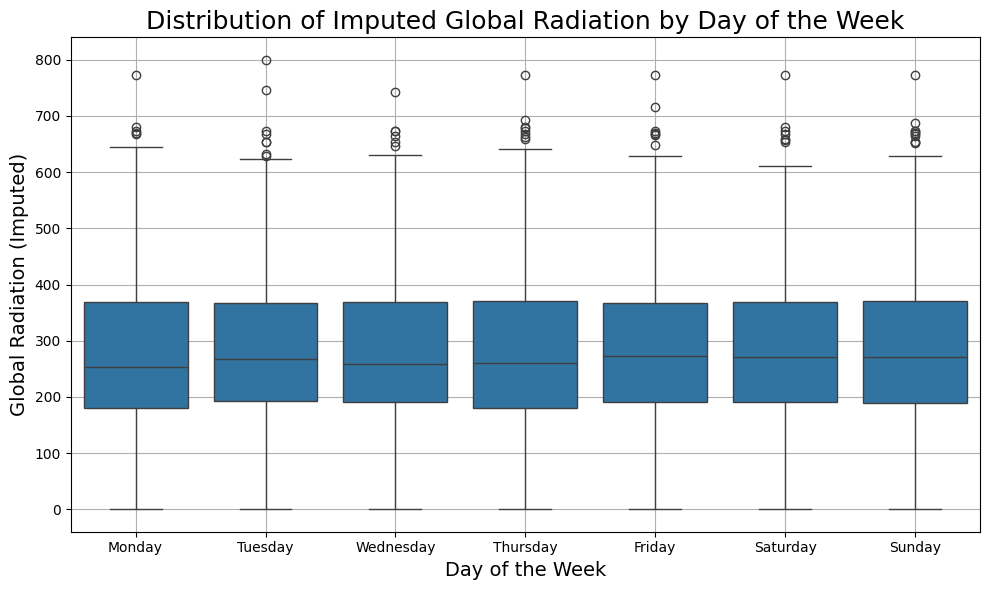

In [ ]:
os.makedirs("figures", exist_ok=True)
daily_series = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('D').mean().dropna()
df_daily = daily_series.to_frame(name='RADIACAO_GLOBAL_IMPUTADA')
df_daily['Day'] = df_daily.index.day_name()
plt.figure(figsize=(10, 6))
sns.boxplot(
    data=df_daily,
    x='Day',
    y='RADIACAO_GLOBAL_IMPUTADA',
    order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
)
plt.title('Distribution of Imputed Global Radiation by Day of the Week', fontsize=18)
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Global Radiation (Imputed)', fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/Boxplot_GlobalRadiation_ByDay.png", dpi=300)
plt.show()


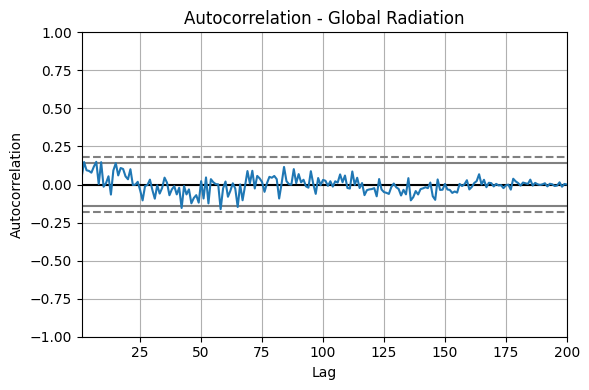

In [ ]:
plt.figure(figsize=(6, 4))
autocorrelation_plot(daily_series.tail(200))
plt.title("Autocorrelation - Global Radiation", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/Autocorrelation_GlobalRadiation_Daily_200days.png", dpi=300)
plt.show()

<Figure size 1000x400 with 0 Axes>

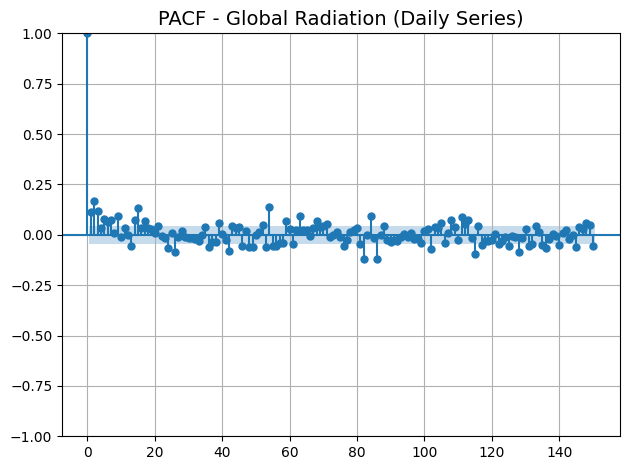

In [ ]:
plt.figure(figsize=(10, 4))
plot_pacf(daily_series.tail(2000), lags=150, method='ywm')  
plt.title("PACF - Global Radiation (Daily Series)", fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/PACF_GlobalRadiation_DailySeries.png", dpi=300)
plt.show()

#####  **EDA MENSUAL**

In [ ]:
df_mensual = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('M').mean().to_frame(name='Promedio_Radiacion_Mensual')
variables = ['Promedio_Radiacion_Mensual']
resumen = {}
for var in variables:
    data = df_mensual[var]
    resumen[var] = {
        'N_records': len(data),
        'μ': data.mean(),
        'σ': data.std(),
        'y_min': data.min(),
        'Q1': data.quantile(0.25),
        'x̄': data.median(),
        'Q3': data.quantile(0.75),
        'y_max': data.max(),
        'Kurtosis': data.kurtosis(),
        'Skewness': data.skew()
    }
df_resumen = pd.DataFrame(resumen)
df_resumen

,Promedio_Radiacion_Mensual
N_records,74.000000
μ,284.331526
σ,49.663561
y_min,225.783565
Q1,249.974238
x̄,274.986044
Q3,313.849497
y_max,411.725806
Kurtosis,1.182565
Skewness,1.264723


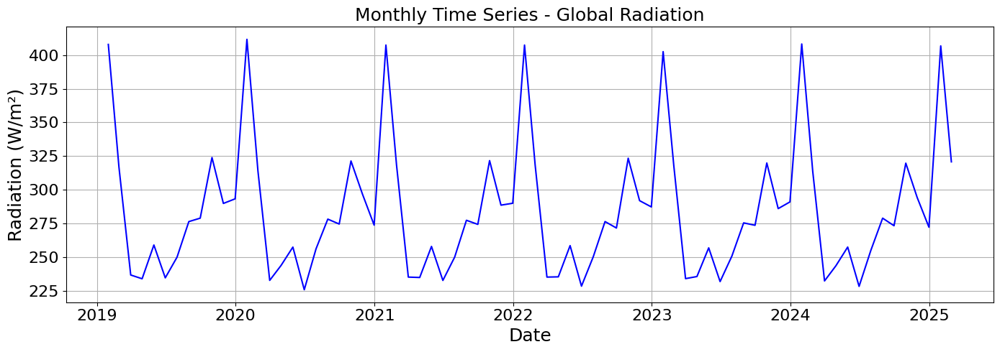

In [ ]:
plt.figure(figsize=(14, 5))
plt.plot(df_mensual, color='blue')
plt.title('Monthly Time Series - Global Radiation', fontsize=18)
plt.xlabel('Date', fontsize=18)
plt.ylabel('Radiation (W/m²)', fontsize=18)
plt.xticks(fontsize=16) 
plt.yticks(fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/Monthly_GlobalRadiation_TimeSeries.png", dpi=300)
plt.show()


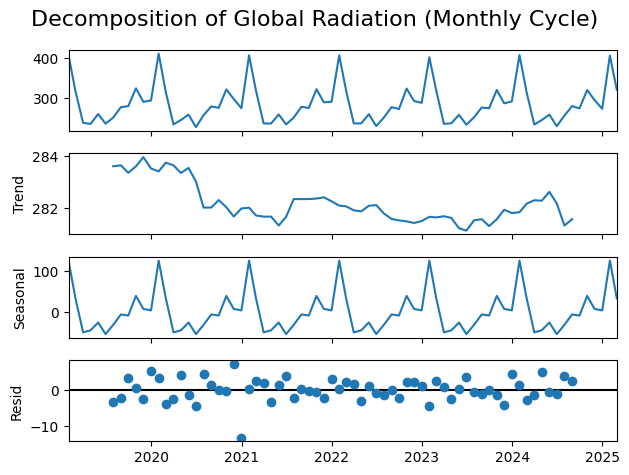

In [ ]:
descomposicion = seasonal_decompose(df_mensual, model='additive', period=12)
descomposicion.plot()
plt.suptitle('Decomposition of Global Radiation (Monthly Cycle)', fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
df_diario = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('D').mean()
df_diario = df_diario.to_frame(name='RADIACAO_GLOBAL_IMPUTADA')
df_diario['Mes'] = df_diario.index.month
agrupado_mes_calendario = df_diario.groupby('Mes')['RADIACAO_GLOBAL_IMPUTADA']
resumen_mensual_simple = pd.DataFrame({
    'N_records': agrupado_mes_calendario.count(),
    'μ': agrupado_mes_calendario.mean(),
    'σ': agrupado_mes_calendario.std(),
    'y_min': agrupado_mes_calendario.min(),
    'Q1': agrupado_mes_calendario.quantile(0.25),
    'x̄': agrupado_mes_calendario.median(),
    'Q3': agrupado_mes_calendario.quantile(0.75),
    'y_max': agrupado_mes_calendario.max(),
    'Kurtosis': agrupado_mes_calendario.apply(pd.Series.kurtosis),
    'Skewness': agrupado_mes_calendario.apply(pd.Series.skew)
})
resumen_mensual_simple.index = pd.to_datetime(resumen_mensual_simple.index, format='%m').month_name()
resumen_mensual_simple

,N_records,μ,σ,y_min,Q1,x̄,Q3,y_max,Kurtosis,Skewness
Mes,,,,,,,,,,
January,217,407.477151,163.626147,68.500000,283.104167,383.895833,516.208333,799.916667,-0.371655,0.164949
February,198,317.083649,133.032529,53.875000,235.833333,304.166667,392.291667,659.645833,0.033322,0.372261
March,186,234.346550,127.571404,3.875000,154.541667,225.500000,298.250000,610.666667,1.327689,0.917040
April,180,237.857407,141.355477,0.583333,140.453125,232.500000,306.776042,596.875000,0.105675,0.537886
May,186,257.869848,113.049078,69.791667,160.177083,244.722222,350.583333,518.916667,-0.768204,0.174336
June,180,230.266204,111.890502,0.000000,147.541667,226.770833,324.916667,430.125000,-0.636302,-0.359935
July,186,252.023746,137.279431,27.916667,168.791667,217.583333,357.541667,630.291667,0.256444,0.710706
August,186,277.110215,101.562718,61.750000,210.166667,274.187500,344.500000,494.375000,-0.488741,-0.054911
September,180,274.390278,129.997583,40.041667,181.416667,258.791667,339.291667,579.208333,-0.158738,0.444753


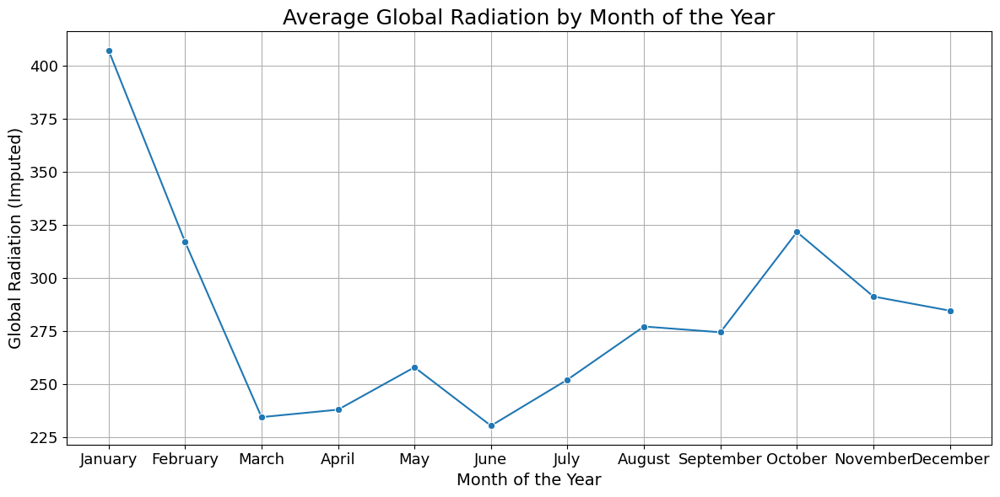

In [ ]:
promedio_por_mes = df_INMET.groupby(df_INMET.index.month)['RADIACAO_GLOBAL_IMPUTADA'].mean()
promedio_por_mes.index = pd.to_datetime(promedio_por_mes.index, format='%m').month_name()
promedio_por_mes = promedio_por_mes.reset_index()
promedio_por_mes.columns = ['Month', 'Average Radiation']
orden_meses = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']
promedio_por_mes = promedio_por_mes.set_index('Month').loc[orden_meses].reset_index()
plt.figure(figsize=(12, 6))
sns.lineplot(data=promedio_por_mes, x='Month', y='Average Radiation', marker='o')
plt.title('Average Global Radiation by Month of the Year', fontsize=18)
plt.xlabel('Month of the Year', fontsize=14)
plt.ylabel('Global Radiation (Imputed)', fontsize=14)
plt.xticks(fontsize=13) 
plt.yticks(fontsize=13)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/avg_radiation_by_month.png", dpi=300)
plt.show()

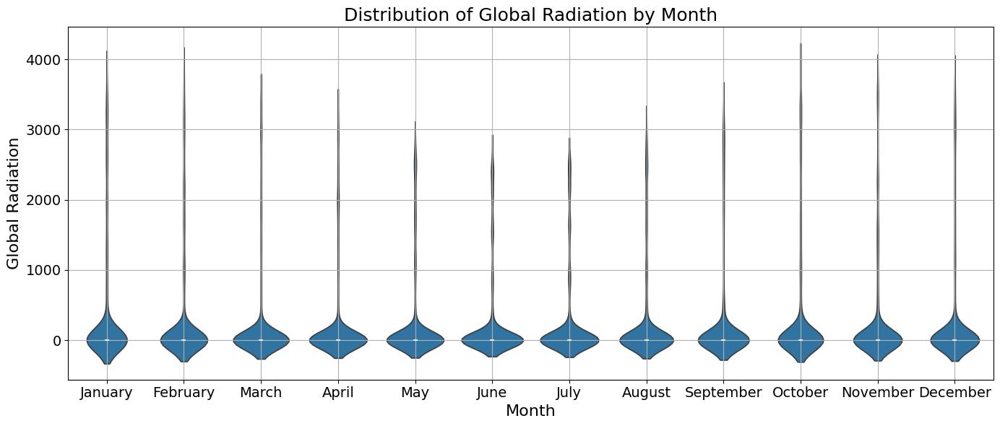

In [ ]:
df_INMET['Month'] = df_INMET.index.month
df_INMET['Month'] = pd.to_datetime(df_INMET['Month'], format='%m').dt.month_name()
month_order = ['January', 'February', 'March', 'April', 'May', 'June',
               'July', 'August', 'September', 'October', 'November', 'December']

os.makedirs("figures", exist_ok=True)
plt.figure(figsize=(14, 6))
sns.violinplot(
    data=df_INMET,
    x='Month',
    y='RADIACAO_GLOBAL_IMPUTADA',
    order=month_order,
    inner='box'  
)
plt.title('Distribution of Global Radiation by Month', fontsize=18)
plt.xlabel('Month', fontsize=16)
plt.ylabel('Global Radiation', fontsize=16)
plt.xticks(fontsize=14) 
plt.yticks(fontsize=14)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/violinplot_radiation_by_month.png", dpi=300)
plt.show()

In [ ]:
df_INMET['Month'] = pd.Categorical(df_INMET['Month'], categories=month_order, ordered=True)

fig = px.violin(
    df_INMET,
    x='Month',
    y='RADIACAO_GLOBAL_IMPUTADA',
    category_orders={'Month': month_order},
    box=True,
    points=False,  
    title='Distribution of Imputed Global Radiation by Month'
)

fig.update_layout(
    title_font_size=18,
    xaxis_title='Month',
    yaxis_title='Global Radiation (Imputed)',
    xaxis_tickangle=45,
    font=dict(size=12)
)
fig.show()


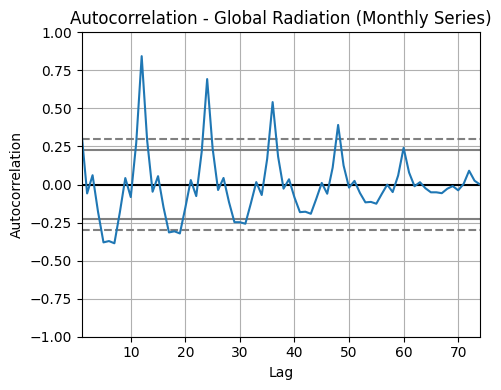

In [ ]:
serie_mensual = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].resample('M').mean()
plt.figure(figsize=(5, 4))
autocorrelation_plot(serie_mensual)
plt.title("Autocorrelation - Global Radiation (Monthly Series)", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/autocorrelation_monthly_series.png", dpi=300)
plt.show()

<Figure size 500x400 with 0 Axes>

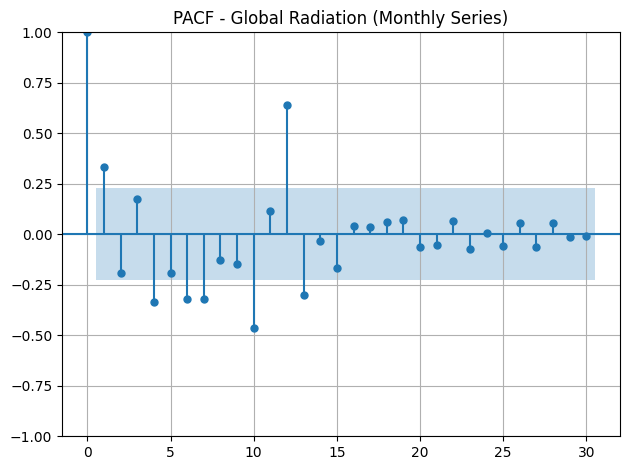

In [ ]:
plt.figure(figsize=(5, 4))
plot_pacf(serie_mensual, lags=30, method='ywm')
plt.title("PACF - Global Radiation (Monthly Series)", fontsize=12)
plt.grid(True)
plt.tight_layout()
plt.savefig("figures/pacf_monthly_series.png", dpi=300)
plt.show()

#### **DWT**

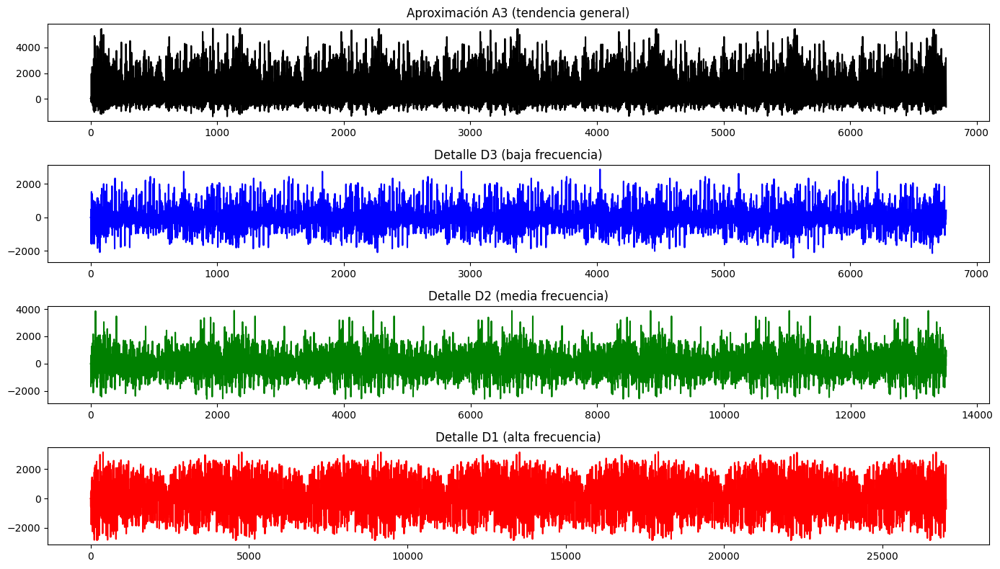

In [ ]:
serie_hr = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].fillna(0)

# Aplicar DWT a nivel 3 con wavelet 'db4'
wavelet = 'db4'
nivel = 3

serie_input = serie_hr.values
coeffs = pywt.wavedec(serie_input, wavelet=wavelet, level=nivel)

# Desempaquetar los coeficientes
A3, D3, D2, D1 = coeffs

# Visualizar resultados
plt.figure(figsize=(14, 8))

plt.subplot(4, 1, 1)
plt.plot(A3, color='black')
plt.title('Aproximación A3 (tendencia general)')

plt.subplot(4, 1, 2)
plt.plot(D3, color='blue')
plt.title('Detalle D3 (baja frecuencia)')

plt.subplot(4, 1, 3)
plt.plot(D2, color='green')
plt.title('Detalle D2 (media frecuencia)')

plt.subplot(4, 1, 4)
plt.plot(D1, color='red')
plt.title('Detalle D1 (alta frecuencia)')

plt.tight_layout()
plt.show()


#### **A3 (Apróximada)**

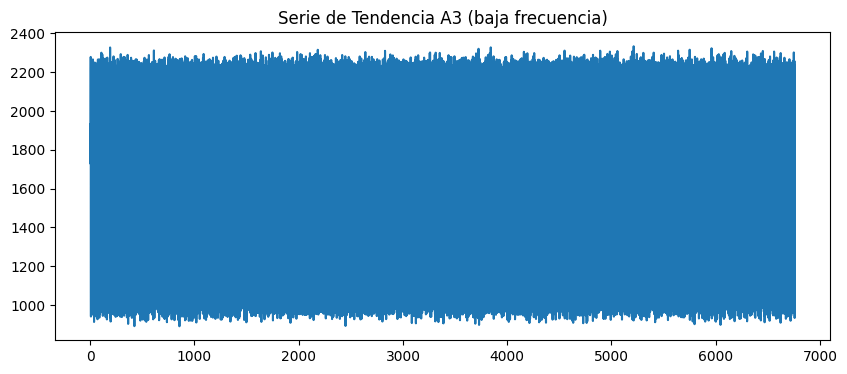

ADF Statistic: -12.600859375786957
p-value: 1.737507854664794e-23


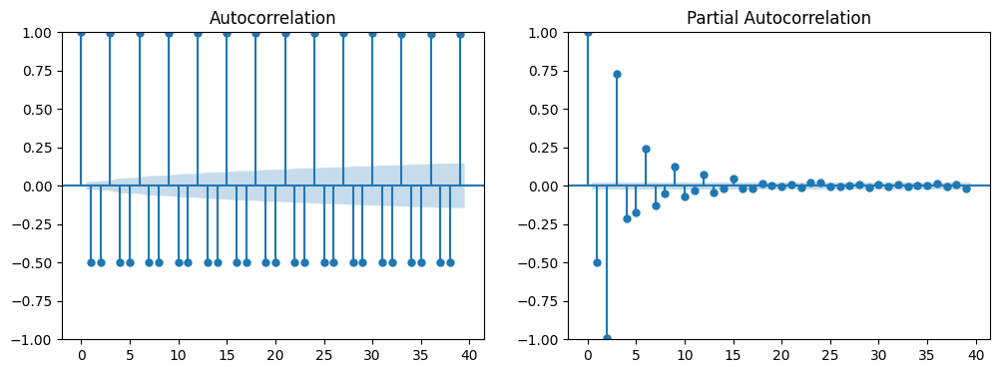

                               SARIMAX Results                                
Dep. Variable:                      y   No. Observations:                 6759
Model:                 ARIMA(2, 0, 2)   Log Likelihood              -34552.281
Date:                Fri, 16 May 2025   AIC                          69116.562
Time:                        10:54:41   BIC                          69157.474
Sample:                             0   HQIC                         69130.685
                               - 6759                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1414.4713      0.528   2677.393      0.000    1413.436    1415.507
ar.L1         -0.9998   8.82e-05  -1.13e+04      0.000      -1.000      -1.000
ar.L2         -0.9996   4.57e-05  -2.19e+04      0.0

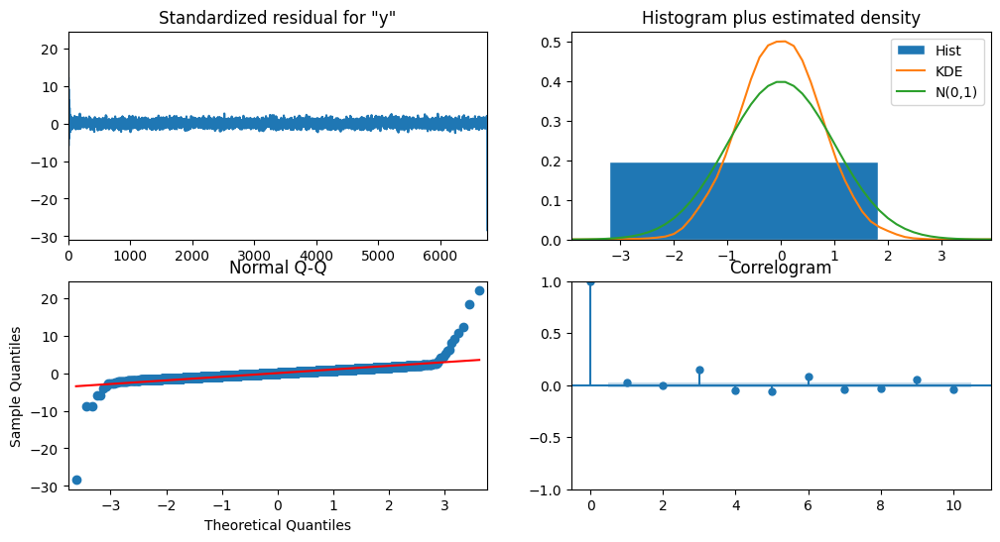

In [ ]:

serie_A3 = pd.Series(A3)
plt.figure(figsize=(10,4))
plt.plot(serie_A3)
plt.title('Serie de Tendencia A3 (baja frecuencia)')
plt.show()
adf_result = adfuller(serie_A3.dropna())
print("ADF Statistic:", adf_result[0])
print("p-value:", adf_result[1])
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(serie_A3.dropna(), ax=ax[0])
plot_pacf(serie_A3.dropna(), ax=ax[1])
plt.show()
modelo = ARIMA(serie_A3, order=(2,0,2))  
resultado = modelo.fit()

print(resultado.summary())
resultado.plot_diagnostics(figsize=(12, 6))
plt.show()

In [ ]:
np.random.seed(42)
horas = pd.date_range(start='2020-01-01', periods=54024, freq='H')
radiacion_simulada = 500 + 300*np.sin(2 * np.pi * horas.hour / 24) + np.random.normal(0, 30, size=len(horas))

df_INMET = pd.DataFrame({
    'RADIACAO_GLOBAL_IMPUTADA': radiacion_simulada
}, index=horas)

serie_hr = df_INMET['RADIACAO_GLOBAL_IMPUTADA'].fillna(0)
wavelet = 'db4'
nivel = 3
coeffs = pywt.wavedec(serie_hr.values, wavelet=wavelet, level=nivel)
A3, D3, D2, D1 = coeffs
serie_A3 = pd.Series(A3)

modelo = ARIMA(serie_A3, order=(2, 0, 2))
resultado = modelo.fit()

fitted_values = resultado.fittedvalues
forecast_12h = resultado.forecast(steps=12)
forecast_18h = resultado.forecast(steps=18)
forecast_24h = resultado.forecast(steps=24)

index_A3 = list(range(len(serie_A3)))
index_12h = list(range(len(serie_A3), len(serie_A3) + 12))
index_18h = list(range(len(serie_A3), len(serie_A3) + 18))
index_24h = list(range(len(serie_A3), len(serie_A3) + 24))


In [ ]:

fig_12h = go.Figure()
fig_12h.add_trace(go.Scatter(x=index_A3, y=serie_A3, name='A3 - Observado', line=dict(color='black')))
fig_12h.add_trace(go.Scatter(x=index_A3, y=fitted_values, name='Ajuste ARIMA', line=dict(color='green', dash='dot')))
fig_12h.add_trace(go.Scatter(x=index_12h, y=forecast_12h, name='Pronóstico 12h', line=dict(color='red', dash='dash')))
fig_12h.update_layout(title='ARIMA sobre A3 – Pronóstico 12 Horas', template='plotly_white')
fig_12h.show()


fig_18h = go.Figure()
fig_18h.add_trace(go.Scatter(x=index_A3, y=serie_A3, name='A3 - Observado', line=dict(color='black')))
fig_18h.add_trace(go.Scatter(x=index_A3, y=fitted_values, name='Ajuste ARIMA', line=dict(color='green', dash='dot')))
fig_18h.add_trace(go.Scatter(x=index_18h, y=forecast_18h, name='Pronóstico 18h', line=dict(color='orange', dash='dash')))
fig_18h.update_layout(title='ARIMA sobre A3 – Pronóstico 18 Horas', template='plotly_white')
fig_18h.show()


fig_24h = go.Figure()
fig_24h.add_trace(go.Scatter(x=index_A3, y=serie_A3, name='A3 - Observado', line=dict(color='black')))
fig_24h.add_trace(go.Scatter(x=index_A3, y=fitted_values, name='Ajuste ARIMA', line=dict(color='green', dash='dot')))
fig_24h.add_trace(go.Scatter(x=index_24h, y=forecast_24h, name='Pronóstico 24h', line=dict(color='blue', dash='dash')))
fig_24h.update_layout(title='ARIMA sobre A3 – Pronóstico 24 Horas', template='plotly_white')
fig_24h.show()
